In [1]:
import keras
keras.__version__

Using TensorFlow backend.


'2.3.1'

In [2]:
from keras.models import load_model

model = load_model('cats_and_dogs_small_2.h5')
model.summary()  # 作为提醒

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 15, 15, 128)      

In [3]:
# 预处理单张图像
img_path = 'resources/dogs-vs-cats-small/test/cats/cat.1700.jpg'

# 将图像预处理为一个4D张量
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# 请记住，训练模型的输入数据都用这种方法预处理
img_tensor /= 255.

# 其形状为(1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


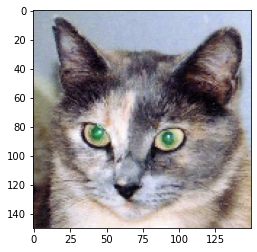

In [4]:
# 显示测试图像
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [5]:
# 用一个输入张量和一个输出张量列表将模型实例化
from keras import models

# 提取前8层的输出
layer_outputs = [layer.output for layer in model.layers[:8]]
# 创建一个模型，给定模型输入，可以返回这些输出
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [6]:
# 返回8个Numpy数组组成的列表，每个层激活对应一个Numpy数组
activations = activation_model.predict(img_tensor)

In [7]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


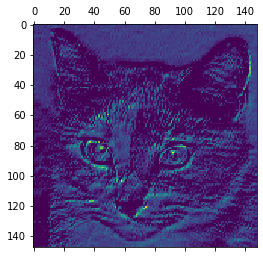

In [8]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

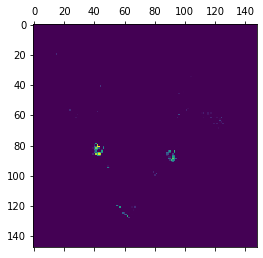

In [9]:
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')
plt.show()

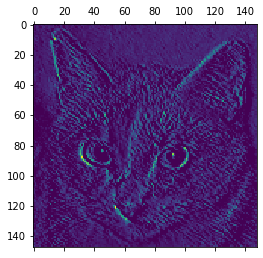

In [10]:
plt.matshow(first_layer_activation[0, :, :, 7], cmap='viridis')
plt.show()

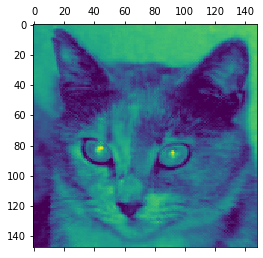

In [11]:
plt.matshow(first_layer_activation[0, :, :, 30], cmap='viridis')
plt.show()

D:\anaconda3\envs\TF_2C\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


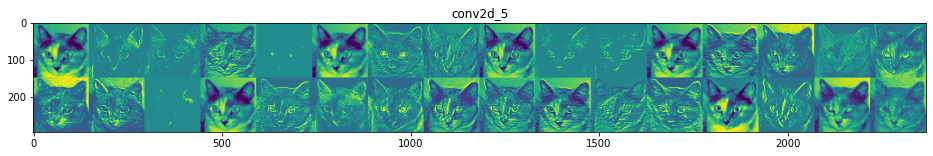

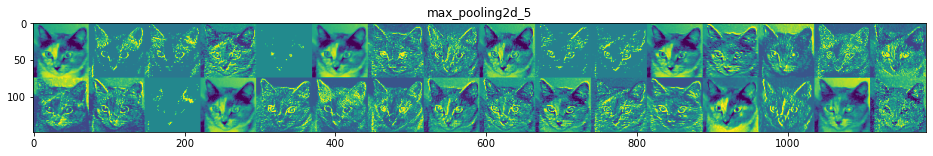

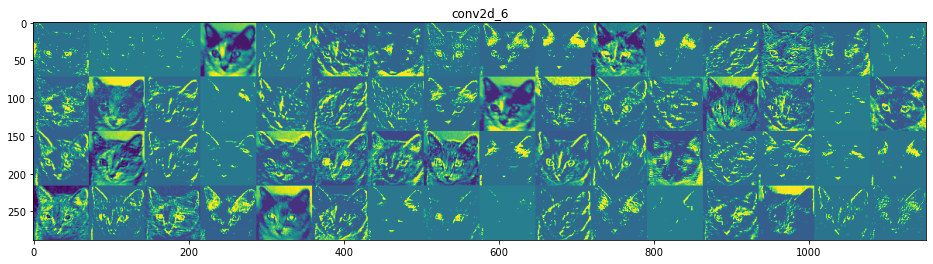

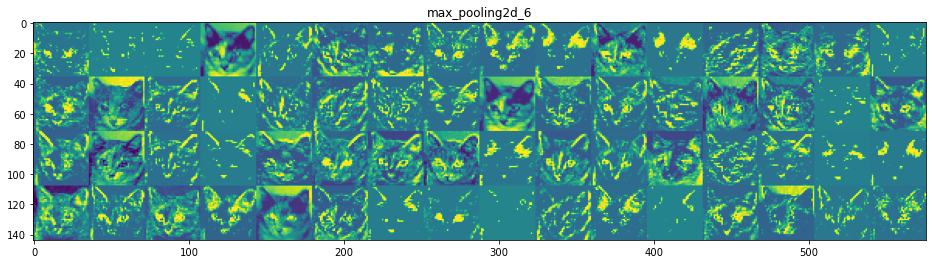

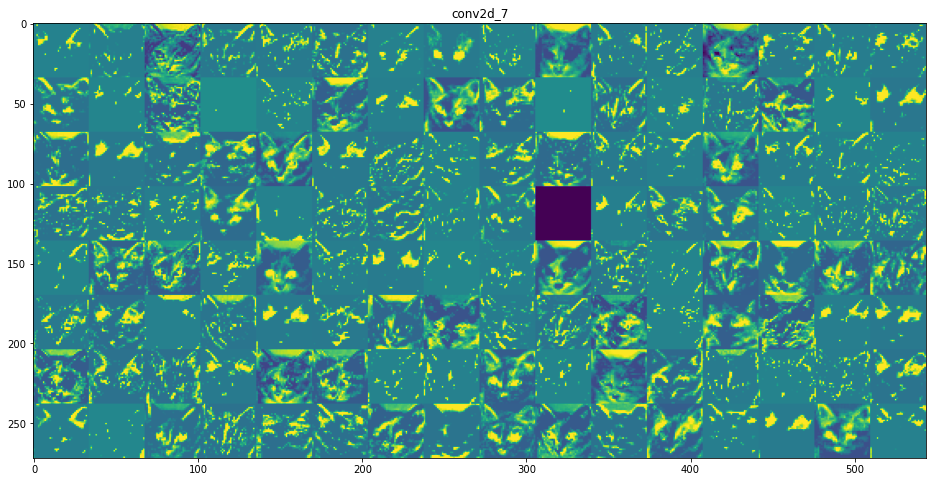

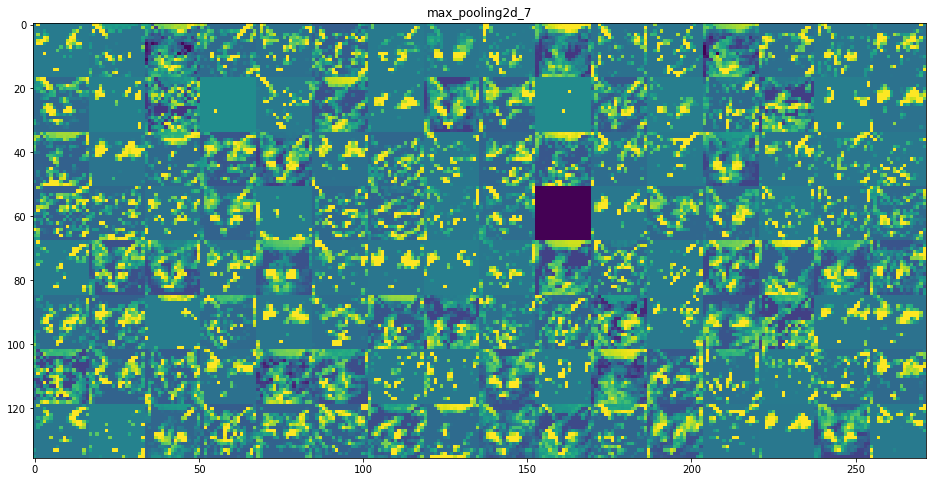

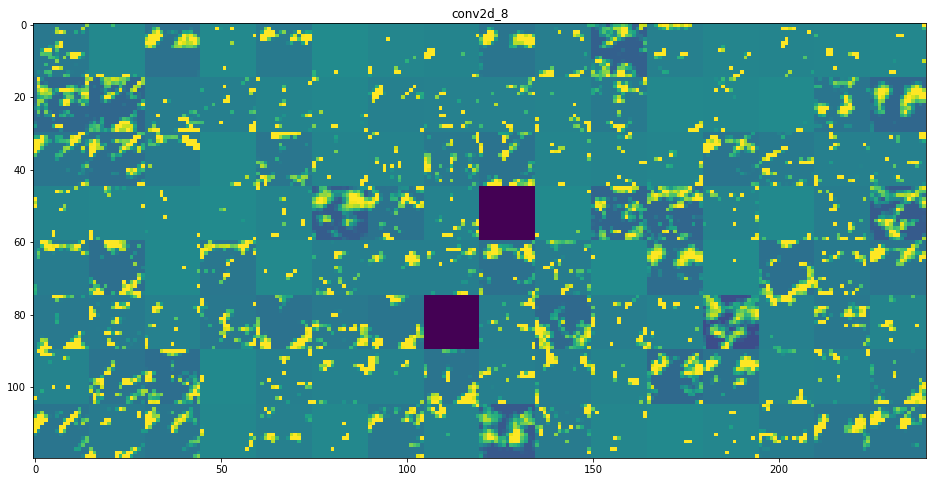

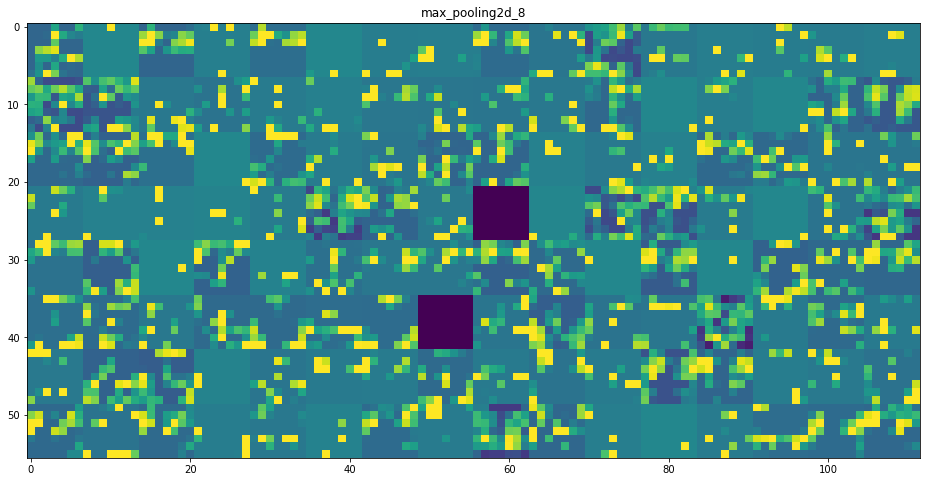

In [12]:
# 将每个中间激活的所有通道可视化

# 层的名称，这样可以将这些名称画到图中
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 显示特征图
for layer_name, layer_activation in zip(layer_names, activations):
    # 特征图中的特征个数
    n_features = layer_activation.shape[-1]
    # 特征退的形状为(1,size,size,n_features)
    size = layer_activation.shape[1]

    # 在这个矩阵中将激活通道平铺
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 将每个过滤器平铺到一个大的水平网格中
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # 对特征进行后处理，使其看起来更美观
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            # 显示网格
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

In [13]:
# 为过滤器的可视化定义损失张量
from keras.applications import VGG16
from keras import backend as K

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [14]:
# 获取损失相对于输入的梯度
# 调用gradients返回的是一个张量列表（本例中列表长度为1）。因此，只保留第一个元素，它是一个张量。
grads = K.gradients(loss, model.input)[0]

In [15]:
# 梯度标准化技巧
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [16]:
# 给定Numpy输入值，得到Numpy输出值
iterate = K.function([model.input], [loss, grads])

import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [17]:
# 通过随机梯度下降让损失最大化
# 从一张带有噪声的灰度图像开始
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.
# 每次梯度更新的步长
step = 1.
# 运行40次梯度上升
for i in range(40):
    # 计算损失值和梯度值
    loss_value, grads_value = iterate([input_img_data])
    # 沿着让损失最大化的方向调节输入图像
    input_img_data += grads_value * step

In [18]:
# 将张量转换为有效图像的实用函数
def deprocess_image(x):
    # 对张量做标准化，使其均值为0，标准差为0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # 将x裁切到[0,1]区间
    x += 0.5
    x = np.clip(x, 0, 1)

    # 将x转换为RGB数组
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [19]:
# 生产过滤器可视化的函数
# 构建一个损失函数，将该层第n个过滤器的激活最大化
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # 计算这个损失相对于输入图像的梯度
    grads = K.gradients(loss, model.input)[0]

    # 标准化技巧：将梯度标准化
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # 返回给定输入图像的损失和梯度
    iterate = K.function([model.input], [loss, grads])

    # 从带有噪声的灰度图像开始
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # 运行40次梯度上升
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return deprocess_image(img)

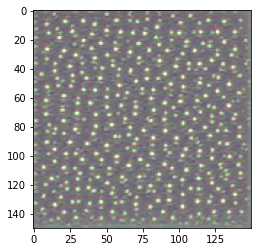

In [20]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

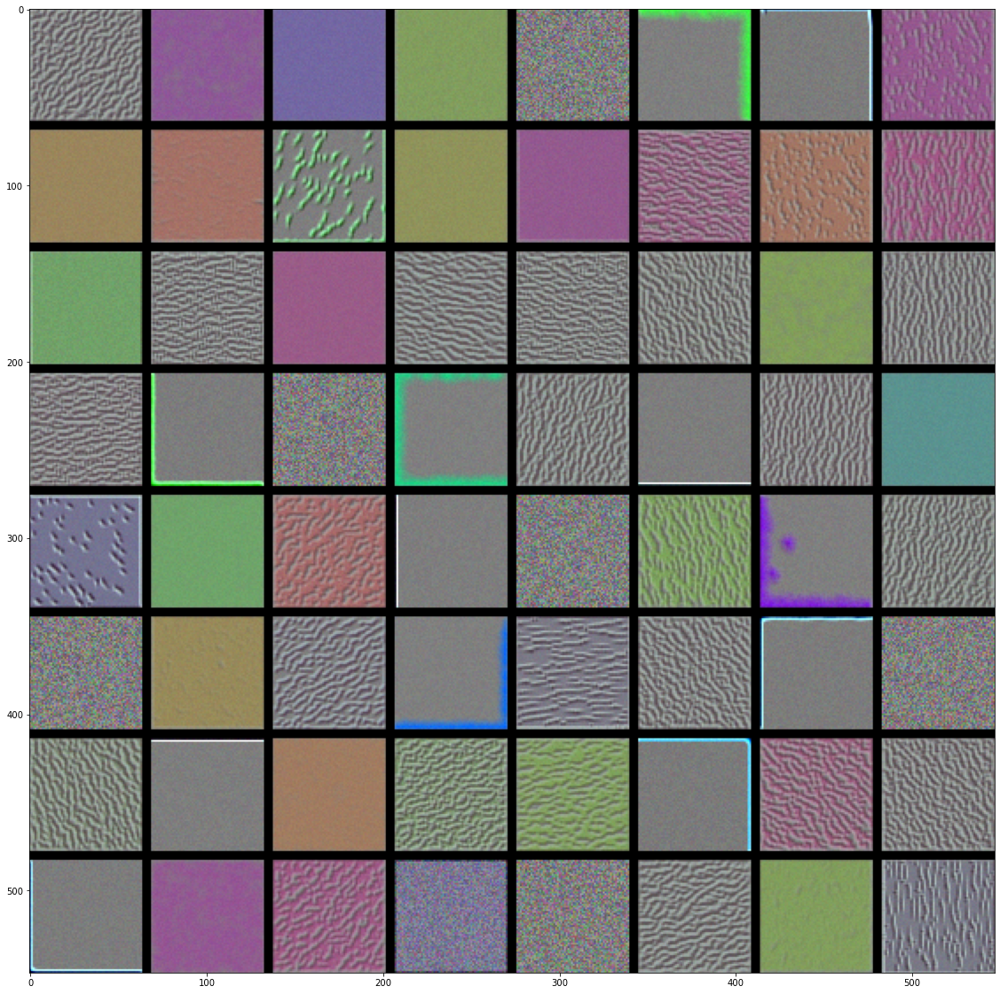

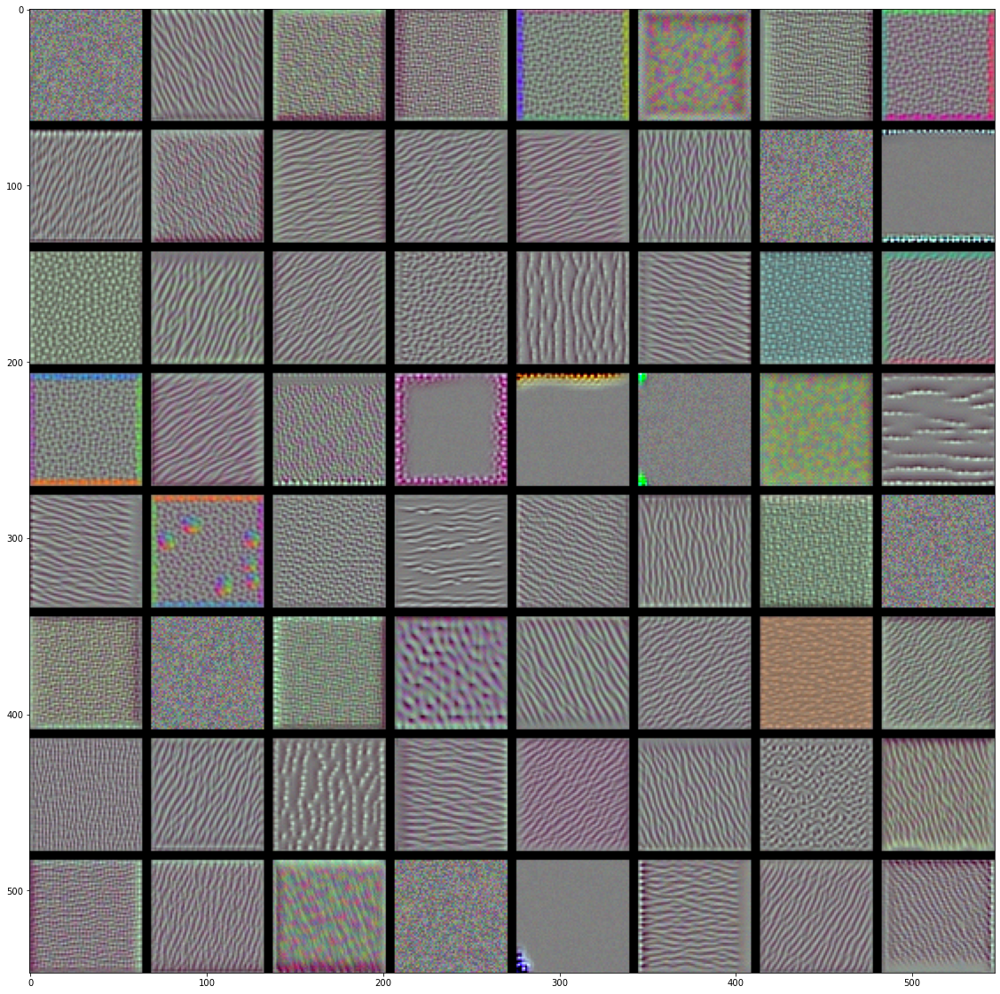

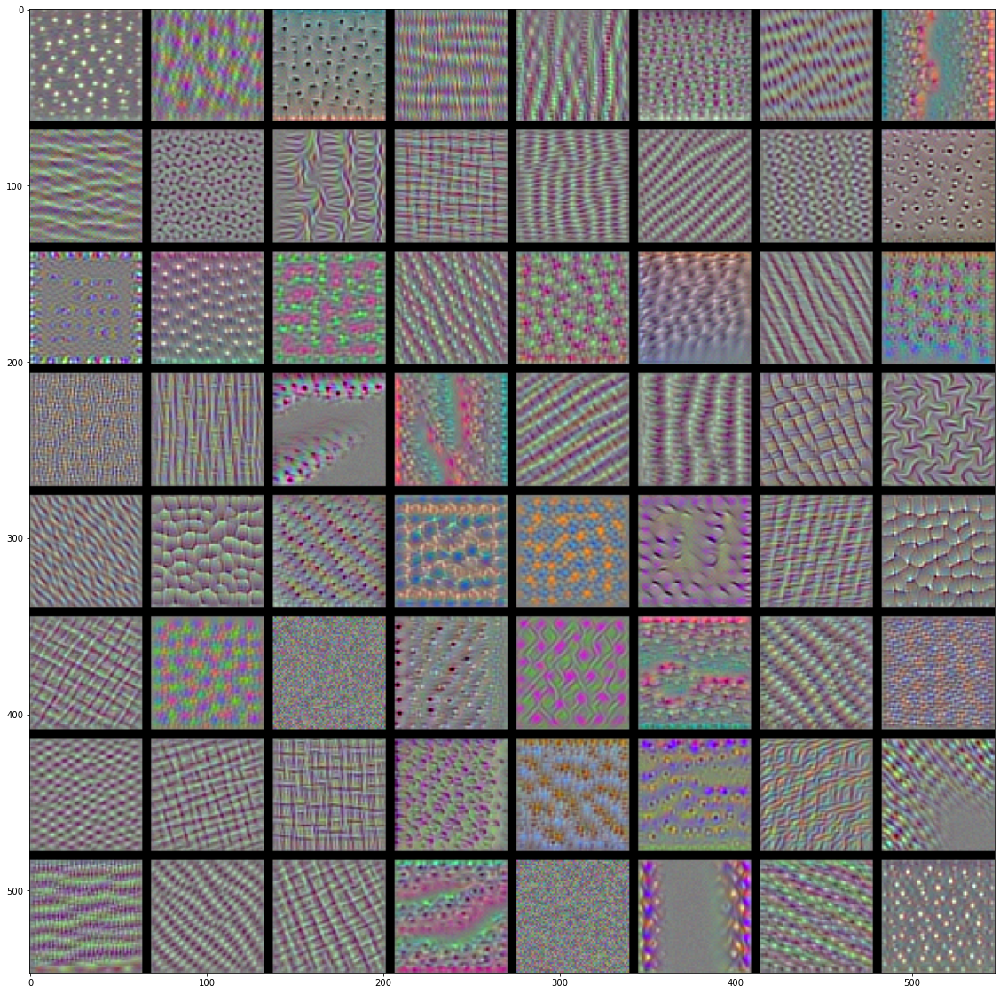

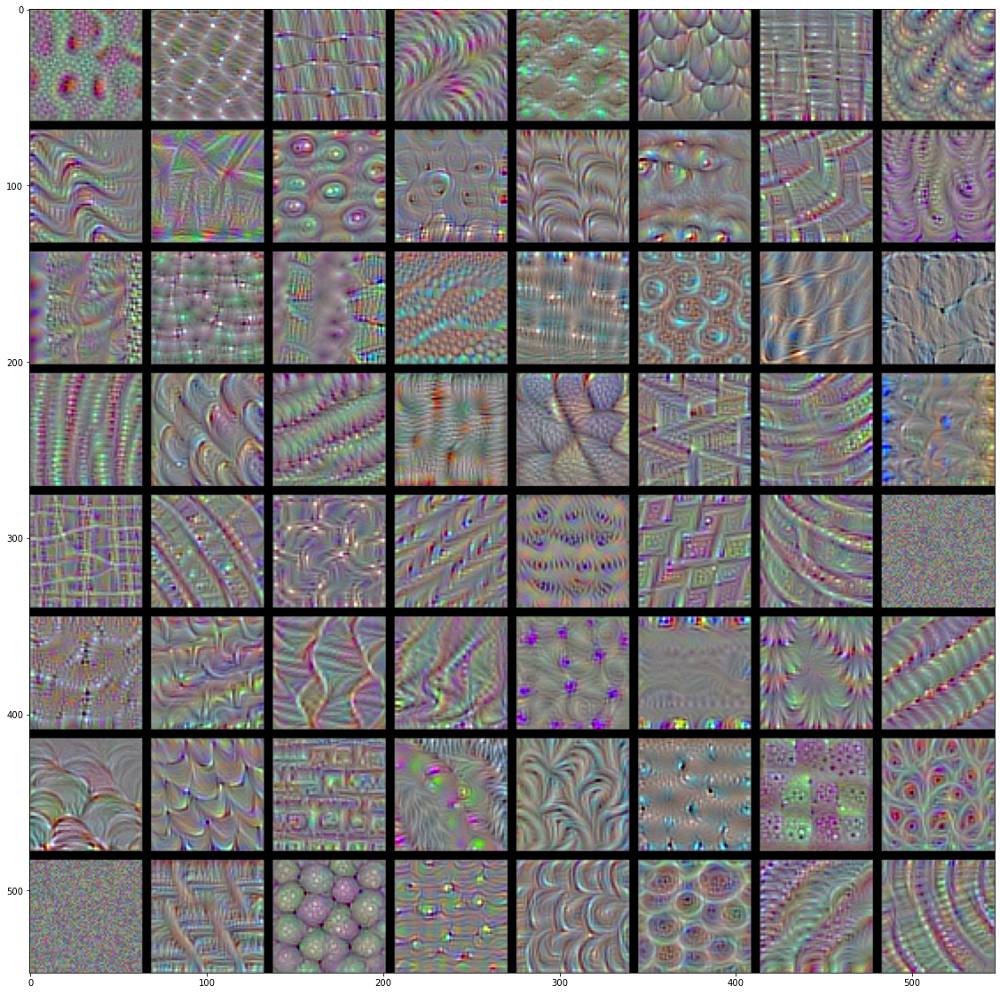

In [21]:
# 生成某一层中所有过滤器响应模式组成的网络
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # 空图像（全黑色），用于保存结果
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8): # 遍历results网格的行
        for j in range(8):  # 遍历results网络的列
            # 生成layer_name层第i+(j*8)个过滤器的模式
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # 将结果放到results网格第(i,j)个方块中
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # 显示results网格
    plt.figure(figsize=(20, 20))
    plt.imshow(results.astype(np.uint8))
    plt.show()

In [27]:
from keras.applications.vgg16 import VGG16

K.clear_session()

# 注意，网络中包括了密集连接分类器。在前面所有的例子中，我们都舍弃了这个分类器
model = VGG16(weights='imagenet')

Exception: URL fetch failure on https://github.com/fchollet/deep-learning-models/releases/download/v0.1/vgg16_weights_tf_dim_ordering_tf_kernels.h5 : None -- [WinError 10060] 由于连接方在一段时间后没有正确答复或连接的主机没有反应，连接尝试失败。

![elephants](https://s3.amazonaws.com/book.keras.io/img/ch5/creative_commons_elephant.jpg)

In [ ]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# 目标图像的本地路径
img_path = 'resources/creative_commons_elephant.jpg'

# 大小为224x224的PIL图像
img = image.load_img(img_path, target_size=(224, 224))

# 形状为(224,224,3)的float32格式的Numpy数组
x = image.img_to_array(img)

# 添加一个维度，将数组转换为(1,224,224,3)形状的批量
x = np.expand_dims(x, axis=0)

# 对批量进行预处理（按通道进行颜色标准化）
x = preprocess_input(x)

In [ ]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

In [ ]:
np.argmax(preds[0])

In [ ]:
# 预测向量中的“非洲象”元素
african_elephant_output = model.output[:, 386]

# block5_conv3层的输出特征图，它是VGG16的最后一个卷积层
last_conv_layer = model.get_layer('block5_conv3')

# “非洲象”类别相对于block5_conv3输出特征图的梯度
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# 形状为(512,)的向量，每个元素是特定特征图通道的梯度平均大小
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# 访问刚刚定义的量：对于给定的样本图像，pooled_grads和block5_conv3层的输出特征图
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# 对于两个大象的样本图像，这两个量都是Numpy数组
pooled_grads_value, conv_layer_output_value = iterate([x])

# 将特征图数组的每个通道乘以“这个通道对大象类别的重要程度”
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# 得到的特征图的逐通道平均值即为类激活的热力图
heatmap = np.mean(conv_layer_output_value, axis=-1)

In [ ]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [ ]:
import cv2

# 用cv2加载原始图像
img = cv2.imread(img_path)

# 将热力图的大小调整为与原始图像相同
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# 将热力图转为RGB格式
heatmap = np.uint8(255 * heatmap)

# 将热力图应用到原始图像
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 这里的0.4是热力图强度因子
superimposed_img = heatmap * 0.4 + img

# 保存图像到硬盘
cv2.imwrite('resources/elephant_cam.jpg', superimposed_img)

![elephant cam](https://s3.amazonaws.com/book.keras.io/img/ch5/elephant_cam.jpg)
